In [1]:
from __future__ import annotations

import json
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from IPython.display import display

CATEGORY_FILTER = None  # e.g. {'linguistic_style', 'ideology'}
PAIR_FILTER = None  # e.g. {'linguistic_style__concise__verbose'}

In [2]:
def layer_index_map(layers: list[int]) -> dict[int, int]:
    """Map stored zero-based layer ids to plot order: 1 = layer 0, max = last layer."""
    return {layer: idx for idx, layer in enumerate(sorted(layers), start=1)}

def load_layer_matrix(pair_dir: Path, variant: str, layer: int) -> np.ndarray:
    layer_path = pair_dir / variant / f'layer_{layer}.npy'
    return np.load(layer_path)

## Combined Concept Projection

Project `negpos` and `posneg` last-token hidden states onto `base_to_pos` and `base_to_neg` concept vectors, then compare whether both concepts are present or one dominates.



In [3]:
# Projection of combined-concept hidden states onto the two contrastive concept vectors

MODEL_NAME = 'Qwen2.5-3B-Instruct'
COMBINED_HIDDEN_ROOT = Path('/Users/xinmingwang/Downloads/hidden_states_negpos_posneg') / MODEL_NAME
STEERING_VECTOR_ROOT = Path('contrastive_hidden_states/data/steering_vectors') / MODEL_NAME
COMBINED_VARIANTS = ('negpos', 'posneg')

assert COMBINED_HIDDEN_ROOT.exists(), f'Combined hidden-state root not found: {COMBINED_HIDDEN_ROOT}'
assert STEERING_VECTOR_ROOT.exists(), f'Steering vector root not found: {STEERING_VECTOR_ROOT}'

COMBINED_HIDDEN_ROOT, STEERING_VECTOR_ROOT



(PosixPath('/Users/xinmingwang/Downloads/hidden_states_negpos_posneg/Qwen2.5-3B-Instruct'),
 PosixPath('contrastive_hidden_states/data/steering_vectors/Qwen2.5-3B-Instruct'))

In [4]:
def unit_vector(v: np.ndarray) -> np.ndarray:
    norm = np.linalg.norm(v)
    if norm == 0:
        return np.full_like(v, np.nan, dtype=np.float64)
    return v / norm


def rowwise_cosine(matrix: np.ndarray, vector: np.ndarray) -> np.ndarray:
    vector_norm = np.linalg.norm(vector)
    matrix_norms = np.linalg.norm(matrix, axis=1)
    denom = matrix_norms * vector_norm
    out = np.full(matrix.shape[0], np.nan, dtype=np.float64)
    mask = denom != 0
    out[mask] = matrix[mask] @ vector / denom[mask]
    return out


def iter_combined_pair_infos(hidden_root: Path):
    for category_dir in sorted(path for path in hidden_root.iterdir() if path.is_dir()):
        if CATEGORY_FILTER and category_dir.name not in CATEGORY_FILTER:
            continue
        for pair_dir in sorted(path for path in category_dir.iterdir() if path.is_dir()):
            if PAIR_FILTER and pair_dir.name not in PAIR_FILTER:
                continue
            metadata_path = pair_dir / 'metadata.json'
            if not metadata_path.exists():
                continue
            metadata = json.loads(metadata_path.read_text(encoding='utf-8'))
            examples = metadata.get('examples', [])
            first_example = examples[0] if examples else {}
            layers = metadata['run_config']['hidden_layers']
            available_variants = set(metadata.get('variant_counts', {}))
            yield {
                'pair_dir': pair_dir,
                'category_key': first_example.get('category_key', category_dir.name),
                'category_name': first_example.get('category_name', category_dir.name),
                'pair_slug': first_example.get('pair_slug', pair_dir.name),
                'positive_concept': first_example.get('positive_concept', ''),
                'negative_concept': first_example.get('negative_concept', ''),
                'layers': layers,
                'available_variants': available_variants,
                'variant_counts': metadata.get('variant_counts', {}),
            }


def load_concept_vectors(vector_root: Path, category_key: str, pair_slug: str) -> tuple[np.ndarray, np.ndarray]:
    pair_vector_dir = vector_root / category_key / pair_slug
    pos_path = pair_vector_dir / 'base_to_pos.npy'
    neg_path = pair_vector_dir / 'base_to_neg.npy'
    if not pos_path.exists() or not neg_path.exists():
        raise FileNotFoundError(f'Missing base_to_pos/base_to_neg vectors under {pair_vector_dir}')
    return np.load(pos_path), np.load(neg_path)


def build_combined_projection_results(
    hidden_root: Path,
    vector_root: Path,
    variants: tuple[str, ...] = COMBINED_VARIANTS,
) -> pd.DataFrame:
    rows = []

    for pair_info in iter_combined_pair_infos(hidden_root):
        pair_dir = pair_info['pair_dir']
        pair_slug = pair_info['pair_slug']
        category_key = pair_info['category_key']
        layer_to_index = layer_index_map(pair_info['layers'])
        base_to_pos, base_to_neg = load_concept_vectors(vector_root, category_key, pair_slug)

        for variant in variants:
            if variant not in pair_info['available_variants']:
                continue

            for layer in sorted(pair_info['layers']):
                hidden = load_layer_matrix(pair_dir, variant, layer).astype(np.float64)
                pos_vec = base_to_pos[layer].astype(np.float64)
                neg_vec = base_to_neg[layer].astype(np.float64)
                pos_unit = unit_vector(pos_vec)
                neg_unit = unit_vector(neg_vec)

                pos_projection = hidden @ pos_unit
                neg_projection = hidden @ neg_unit
                pos_cosine = rowwise_cosine(hidden, pos_vec)
                neg_cosine = rowwise_cosine(hidden, neg_vec)

                rows.append({
                    'category_key': category_key,
                    'category_name': pair_info['category_name'],
                    'pair_slug': pair_slug,
                    'concept_label': f"{pair_info['positive_concept']} vs {pair_info['negative_concept']}",
                    'positive_concept': pair_info['positive_concept'],
                    'negative_concept': pair_info['negative_concept'],
                    'variant': variant,
                    'layer': layer,
                    'layer_index': layer_to_index[layer],
                    'n_examples': hidden.shape[0],
                    'hidden_dim': hidden.shape[1],
                    'mean_pos_projection': float(np.nanmean(pos_projection)),
                    'mean_neg_projection': float(np.nanmean(neg_projection)),
                    'mean_projection_dominance_pos_minus_neg': float(np.nanmean(pos_projection - neg_projection)),
                    'mean_abs_projection_gap': float(np.nanmean(np.abs(pos_projection - neg_projection))),
                    'mean_min_projection': float(np.nanmean(np.minimum(pos_projection, neg_projection))),
                    'mean_pos_cosine': float(np.nanmean(pos_cosine)),
                    'mean_neg_cosine': float(np.nanmean(neg_cosine)),
                    'mean_cosine_dominance_pos_minus_neg': float(np.nanmean(pos_cosine - neg_cosine)),
                    'frac_pos_projection_dominates': float(np.nanmean(pos_projection > neg_projection)),
                    'frac_neg_projection_dominates': float(np.nanmean(neg_projection > pos_projection)),
                    'pos_vector_norm': float(np.linalg.norm(pos_vec)),
                    'neg_vector_norm': float(np.linalg.norm(neg_vec)),
                    'mean_hidden_norm': float(np.nanmean(np.linalg.norm(hidden, axis=1))),
                })

    df = pd.DataFrame(rows)
    if df.empty:
        raise ValueError(
            f'No combined projection rows found. Check hidden root {hidden_root} and variants {variants}.'
        )
    return df.sort_values(['layer_index', 'category_key', 'pair_slug', 'variant']).reset_index(drop=True)


combined_projection_df = build_combined_projection_results(COMBINED_HIDDEN_ROOT, STEERING_VECTOR_ROOT)

print(
    f"Loaded {combined_projection_df['pair_slug'].nunique()} pairs, "
    f"{combined_projection_df['variant'].nunique()} variants, "
    f"{combined_projection_df['layer_index'].nunique()} layers"
)
display(combined_projection_df.head())



Loaded 150 pairs, 2 variants, 36 layers


,category_key,category_name,pair_slug,concept_label,positive_concept,negative_concept,variant,layer,layer_index,n_examples,...,mean_abs_projection_gap,mean_min_projection,mean_pos_cosine,mean_neg_cosine,mean_cosine_dominance_pos_minus_neg,frac_pos_projection_dominates,frac_neg_projection_dominates,pos_vector_norm,neg_vector_norm,mean_hidden_norm
0,ideology,IDEOLOGY,ideology__centralization_support__decentraliza...,centralization-support vs decentralization-sup...,centralization-support,decentralization-support,negpos,0,1,100,...,0.187054,0.805402,0.017056,0.020832,-0.003776,0.1,0.9,1.054272,0.615854,47.476107
1,ideology,IDEOLOGY,ideology__centralization_support__decentraliza...,centralization-support vs decentralization-sup...,centralization-support,decentralization-support,posneg,0,1,100,...,0.195328,0.801137,0.016950,0.020930,-0.003980,0.1,0.9,1.054272,0.615854,47.479750
2,ideology,IDEOLOGY,ideology__collective_benefit__personal_benefit,collective-benefit vs personal-benefit,collective-benefit,personal-benefit,negpos,0,1,100,...,1.031498,-0.379883,0.013737,-0.007993,0.021730,1.0,0.0,1.039322,0.617053,47.466208
3,ideology,IDEOLOGY,ideology__collective_benefit__personal_benefit,collective-benefit vs personal-benefit,collective-benefit,personal-benefit,posneg,0,1,100,...,1.017000,-0.375243,0.013530,-0.007896,0.021426,1.0,0.0,1.039322,0.617053,47.462159
4,ideology,IDEOLOGY,ideology__collective_responsibility__individua...,collective-responsibility vs individual-respon...,collective-responsibility,individual-responsibility,negpos,0,1,100,...,1.442385,-0.874578,0.011973,-0.018418,0.030391,1.0,0.0,1.065498,0.614030,47.458307


In [12]:
combined_layer_summary = (
    combined_projection_df
    .groupby(['variant', 'layer_index'], as_index=False)
    .agg(
        mean_pos_projection=('mean_pos_projection', 'mean'),
        mean_neg_projection=('mean_neg_projection', 'mean'),
        mean_projection_dominance_pos_minus_neg=('mean_projection_dominance_pos_minus_neg', 'mean'),
        mean_abs_projection_gap=('mean_abs_projection_gap', 'mean'),
        mean_min_projection=('mean_min_projection', 'mean'),
        mean_pos_cosine=('mean_pos_cosine', 'mean'),
        mean_neg_cosine=('mean_neg_cosine', 'mean'),
        mean_cosine_dominance_pos_minus_neg=('mean_cosine_dominance_pos_minus_neg', 'mean'),
        mean_frac_pos_projection_dominates=('frac_pos_projection_dominates', 'mean'),
        mean_frac_neg_projection_dominates=('frac_neg_projection_dominates', 'mean'),
        num_pairs=('pair_slug', 'nunique'),
    )
    .sort_values(['variant', 'layer_index'])
)

display(combined_layer_summary)

display(
    combined_projection_df[[
        'category_key',
        'concept_label',
        'variant',
        'layer_index',
        'mean_pos_projection',
        'mean_neg_projection',
        'mean_projection_dominance_pos_minus_neg',
        'mean_pos_cosine',
        'mean_neg_cosine',
        'mean_cosine_dominance_pos_minus_neg',
        'frac_pos_projection_dominates',
        'frac_neg_projection_dominates',
    ]].head(50)
)



,variant,layer_index,mean_pos_projection,mean_neg_projection,mean_projection_dominance_pos_minus_neg,mean_abs_projection_gap,mean_min_projection,mean_pos_cosine,mean_neg_cosine,mean_cosine_dominance_pos_minus_neg,mean_frac_pos_projection_dominates,mean_frac_neg_projection_dominates,num_pairs
0,negpos,1,2.183665,2.157528,0.026137,1.808701,1.266246,0.045990,0.045438,0.000552,0.481467,0.518533,150
1,negpos,2,-9.421650,-7.031754,-2.389895,3.477204,-9.965304,-0.162188,-0.121099,-0.041089,0.239467,0.760533,150
2,negpos,3,-8.367160,-5.061540,-3.305620,3.786929,-8.607814,-0.144559,-0.087496,-0.057063,0.132267,0.867733,150
3,negpos,4,-7.368987,-5.335706,-2.033281,2.188038,-7.446366,-0.125134,-0.090625,-0.034510,0.105733,0.894267,150
4,negpos,5,-3.833408,-2.453948,-1.379460,1.507124,-3.897240,-0.062388,-0.039942,-0.022445,0.119600,0.880400,150
...,...,...,...,...,...,...,...,...,...,...,...,...,...
67,posneg,32,-14.595887,-21.106542,6.510655,11.867256,-23.784843,-0.055390,-0.079953,0.024563,0.744600,0.255400,150
68,posneg,33,3.000576,-0.856743,3.857319,9.723404,-3.789786,0.010017,-0.003365,0.013381,0.643733,0.356267,150
69,posneg,34,-3.061674,-1.015835,-2.045839,10.499573,-7.288541,-0.011247,-0.003945,-0.007303,0.425667,0.574333,150
70,posneg,35,-16.247818,-15.015683,-1.232135,9.322853,-20.293177,-0.054097,-0.050005,-0.004092,0.427067,0.572933,150


,category_key,concept_label,variant,layer_index,mean_pos_projection,mean_neg_projection,mean_projection_dominance_pos_minus_neg,mean_pos_cosine,mean_neg_cosine,mean_cosine_dominance_pos_minus_neg,frac_pos_projection_dominates,frac_neg_projection_dominates
0,ideology,centralization-support vs decentralization-sup...,negpos,1,0.809320,0.988538,-0.179218,0.017056,0.020832,-0.003776,0.10,0.90
1,ideology,centralization-support vs decentralization-sup...,posneg,1,0.804344,0.993259,-0.188915,0.016950,0.020930,-0.003980,0.10,0.90
2,ideology,collective-benefit vs personal-benefit,negpos,1,0.651615,-0.379883,1.031498,0.013737,-0.007993,0.021730,1.00,0.00
3,ideology,collective-benefit vs personal-benefit,posneg,1,0.641757,-0.375243,1.017000,0.013530,-0.007896,0.021426,1.00,0.00
4,ideology,collective-responsibility vs individual-respon...,negpos,1,0.567808,-0.874578,1.442385,0.011973,-0.018418,0.030391,1.00,0.00
5,ideology,collective-responsibility vs individual-respon...,posneg,1,0.558631,-0.877718,1.436349,0.011779,-0.018485,0.030264,1.00,0.00
6,ideology,collective-security vs civil-liberty,negpos,1,2.004195,-1.307001,3.311196,0.042254,-0.027539,0.069793,1.00,0.00
7,ideology,collective-security vs civil-liberty,posneg,1,2.001779,-1.301126,3.302904,0.042208,-0.027418,0.069626,1.00,0.00
8,ideology,collective-welfare vs individual-liberty,negpos,1,2.453985,-1.425006,3.878992,0.051678,-0.029992,0.081670,1.00,0.00
9,ideology,collective-welfare vs individual-liberty,posneg,1,2.438950,-1.433734,3.872685,0.051364,-0.030178,0.081542,1.00,0.00


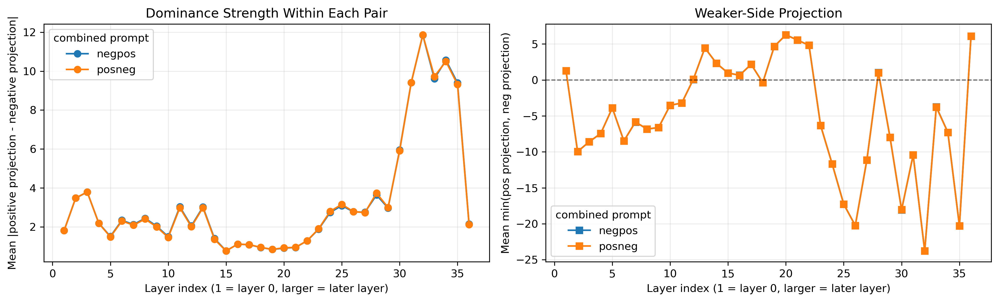

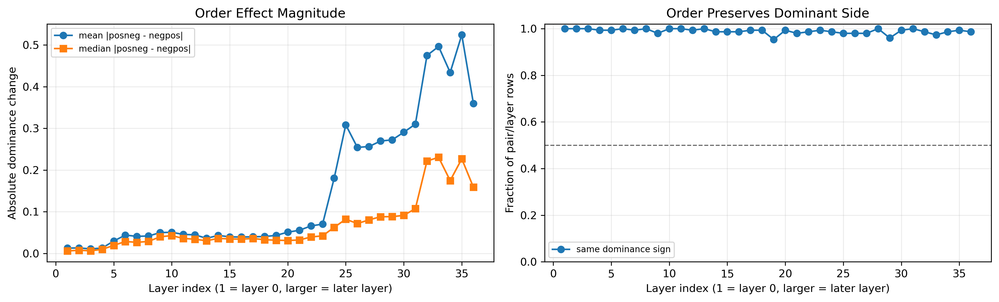

,layer_index,mean_abs_order_effect,median_abs_order_effect,mean_relative_order_effect,same_dominance_sign_fraction,mean_abs_dominance
0,1,0.012860,0.006023,0.031988,1.000000,1.803736
1,2,0.013285,0.007747,0.016452,1.000000,3.476638
2,3,0.011016,0.006462,0.009584,1.000000,3.788398
3,4,0.012954,0.009849,0.025195,0.993333,2.180778
4,5,0.029930,0.019459,0.055341,0.993333,1.493817


In [13]:
# More interpretable aggregate plots.
# We avoid averaging raw positive/negative projections across pairs because
# "positive" and "negative" are pair-local labels, not universal semantic axes.

fig, axes = plt.subplots(1, 2, figsize=(13, 4), dpi=300, sharex=True)

for variant, variant_df in combined_layer_summary.groupby('variant'):
    variant_df = variant_df.sort_values('layer_index')
    axes[0].plot(
        variant_df['layer_index'],
        variant_df['mean_abs_projection_gap'],
        marker='o',
        label=variant,
    )
    axes[1].plot(
        variant_df['layer_index'],
        variant_df['mean_min_projection'],
        marker='s',
        label=variant,
    )

axes[0].set_title('Dominance Strength Within Each Pair')
axes[0].set_xlabel('Layer index (1 = layer 0, larger = later layer)')
axes[0].set_ylabel('Mean |positive projection - negative projection|')
axes[0].grid(alpha=0.25)
axes[0].legend(title='combined prompt')

axes[1].axhline(0.0, color='black', linewidth=1, linestyle='--', alpha=0.6)
axes[1].set_title('Weaker-Side Projection')
axes[1].set_xlabel('Layer index (1 = layer 0, larger = later layer)')
axes[1].set_ylabel('Mean min(pos projection, neg projection)')
axes[1].grid(alpha=0.25)
axes[1].legend(title='combined prompt')

plt.tight_layout()
plt.show()

# Direct order-effect summary: compare posneg and negpos within the same pair/layer.
order_key_cols = ['category_key', 'pair_slug', 'concept_label', 'layer_index']
order_wide = (
    combined_projection_df
    .pivot_table(
        index=order_key_cols,
        columns='variant',
        values='mean_projection_dominance_pos_minus_neg',
        aggfunc='mean',
    )
    .reset_index()
)
order_wide['order_effect_posneg_minus_negpos'] = order_wide['posneg'] - order_wide['negpos']
order_wide['abs_order_effect'] = order_wide['order_effect_posneg_minus_negpos'].abs()
order_wide['mean_abs_dominance'] = (order_wide['posneg'].abs() + order_wide['negpos'].abs()) / 2.0
order_wide['relative_order_effect'] = order_wide['abs_order_effect'] / order_wide['mean_abs_dominance'].replace(0, np.nan)
order_wide['same_dominance_sign'] = np.sign(order_wide['posneg']) == np.sign(order_wide['negpos'])

order_layer_summary = (
    order_wide
    .groupby('layer_index', as_index=False)
    .agg(
        mean_abs_order_effect=('abs_order_effect', 'mean'),
        median_abs_order_effect=('abs_order_effect', 'median'),
        mean_relative_order_effect=('relative_order_effect', 'mean'),
        same_dominance_sign_fraction=('same_dominance_sign', 'mean'),
        mean_abs_dominance=('mean_abs_dominance', 'mean'),
    )
)

fig, axes = plt.subplots(1, 2, figsize=(13, 4), dpi=300, sharex=True)
axes[0].plot(
    order_layer_summary['layer_index'],
    order_layer_summary['mean_abs_order_effect'],
    marker='o',
    label='mean |posneg - negpos|',
)
axes[0].plot(
    order_layer_summary['layer_index'],
    order_layer_summary['median_abs_order_effect'],
    marker='s',
    label='median |posneg - negpos|',
)
axes[0].set_title('Order Effect Magnitude')
axes[0].set_xlabel('Layer index (1 = layer 0, larger = later layer)')
axes[0].set_ylabel('Absolute dominance change')
axes[0].grid(alpha=0.25)
axes[0].legend(fontsize=8)

axes[1].plot(
    order_layer_summary['layer_index'],
    order_layer_summary['same_dominance_sign_fraction'],
    marker='o',
    label='same dominance sign',
)
axes[1].axhline(0.5, color='black', linewidth=1, linestyle='--', alpha=0.6)
axes[1].set_ylim(0, 1.02)
axes[1].set_title('Order Preserves Dominant Side')
axes[1].set_xlabel('Layer index (1 = layer 0, larger = later layer)')
axes[1].set_ylabel('Fraction of pair/layer rows')
axes[1].grid(alpha=0.25)
axes[1].legend(fontsize=8)

plt.tight_layout()
plt.show()

display(order_layer_summary.head())



In [14]:
def plot_combined_projection_heatmap(
    df: pd.DataFrame,
    variant: str,
    value_col: str = 'mean_projection_dominance_pos_minus_neg',
    category_key: str | None = None,
    figsize=(14, 18),
):
    subset = df.loc[df['variant'] == variant].copy()
    if category_key is not None:
        subset = subset.loc[subset['category_key'] == category_key]
    if subset.empty:
        raise ValueError(f'No rows for variant={variant!r}, category_key={category_key!r}')

    heatmap_df = subset.pivot(index='concept_label', columns='layer_index', values=value_col)
    heatmap_df = heatmap_df.reindex(sorted(heatmap_df.columns), axis=1)

    max_abs = np.nanmax(np.abs(heatmap_df.to_numpy()))
    vmax = max_abs if max_abs > 0 else 1.0

    fig, ax = plt.subplots(figsize=figsize, dpi=300)
    im = ax.imshow(
        heatmap_df.to_numpy(),
        aspect='auto',
        cmap='coolwarm',
        vmin=-vmax,
        vmax=vmax,
    )
    ax.set_xticks(range(len(heatmap_df.columns)))
    ax.set_xticklabels(heatmap_df.columns)
    ax.set_yticks(range(len(heatmap_df.index)))
    ax.set_yticklabels(heatmap_df.index)
    ax.set_xlabel('Layer index (1 = layer 0, larger = later layer)')
    ax.set_ylabel('Concept pair')
    title_suffix = '' if category_key is None else f' ({category_key})'
    ax.set_title(f'{variant}: positive projection - negative projection{title_suffix}')
    cbar = fig.colorbar(im, ax=ax, shrink=0.8)
    cbar.set_label(value_col)
    plt.tight_layout()
    return heatmap_df


heatmap_tables = {}
for variant in COMBINED_VARIANTS:
    heatmap_tables[variant] = plot_combined_projection_heatmap(
        combined_projection_df,
        variant=variant,
        value_col='mean_projection_dominance_pos_minus_neg',
        figsize=(14, max(6, 0.28 * combined_projection_df['pair_slug'].nunique())),
    )
    plt.show()

# Optional category-specific heatmap example:
# plot_combined_projection_heatmap(combined_projection_df, variant='negpos', category_key='ideology')



In [15]:
combined_output_dir = Path('contrast_sanity_outputs')
combined_output_dir.mkdir(exist_ok=True)

combined_projection_df.to_csv(combined_output_dir / 'combined_concept_projection_all.csv', index=False)
combined_layer_summary.to_csv(combined_output_dir / 'combined_concept_projection_layer_summary.csv', index=False)

print(f'Saved combined-concept projection outputs to: {combined_output_dir.resolve()}')



Saved combined-concept projection outputs to: /Users/xinmingwang/Library/CloudStorage/OneDrive-NationalUniversityofSingapore/Wisc/contrast_sanity_outputs


## All-Category Order Comparison From CSV

Read the saved combined projection CSV and draw all-category `negpos` vs `posneg` heatmaps with a shared color scale, plus an order-effect heatmap.



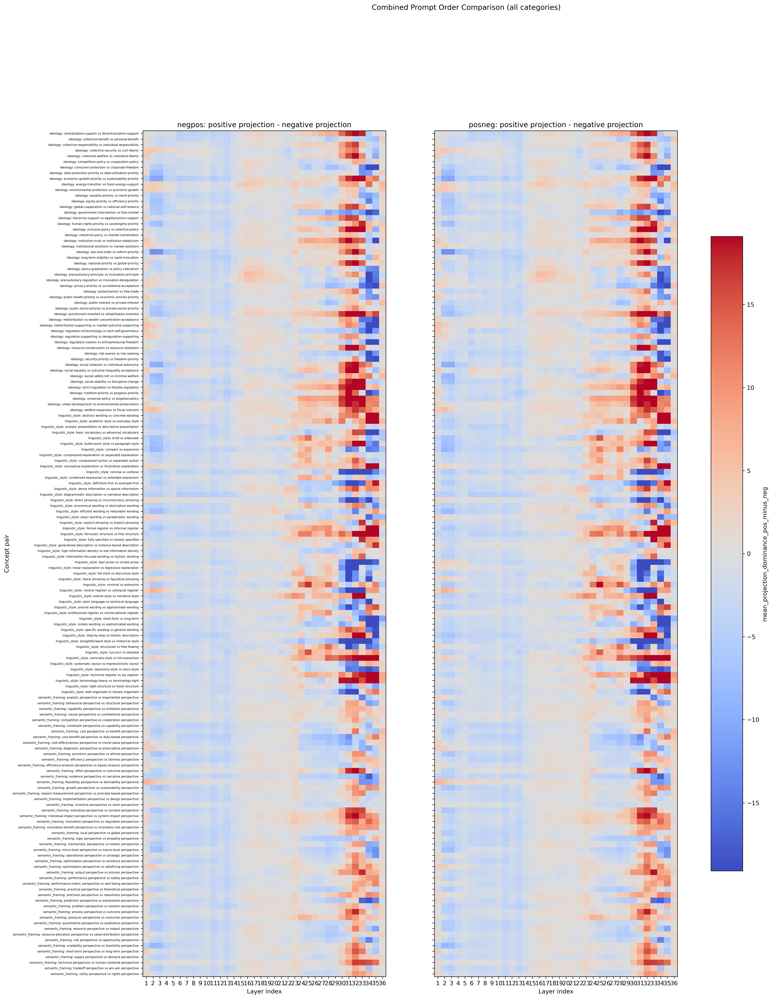

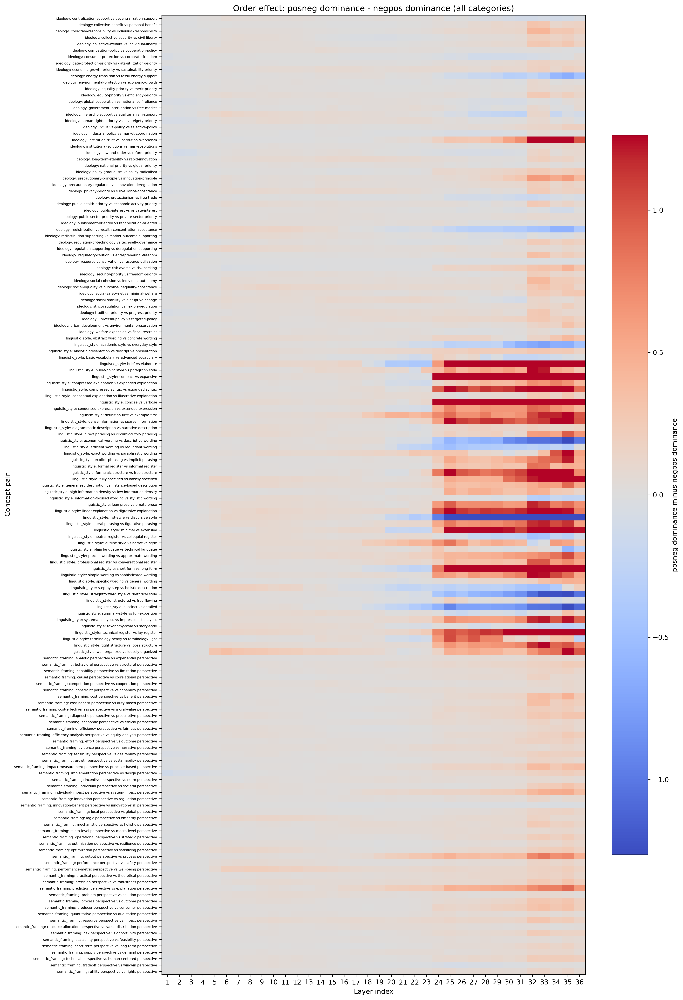

Saved comparison heatmap to: contrast_sanity_outputs/plots/combined_projection_heatmap_negpos_vs_posneg_all_categories.png
Saved order-effect heatmap to: contrast_sanity_outputs/plots/combined_projection_heatmap_order_effect_posneg_minus_negpos_all_categories.png


In [16]:
CSV_OUTPUT_DIR = Path('contrast_sanity_outputs')
PLOT_OUTPUT_DIR = CSV_OUTPUT_DIR / 'plots'
PLOT_OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

combined_projection_all_csv = CSV_OUTPUT_DIR / 'combined_concept_projection_all.csv'
combined_projection_all_df = pd.read_csv(combined_projection_all_csv)

ORDER_COMPARISON_VALUE_COL = 'mean_projection_dominance_pos_minus_neg'


def pivot_order_variant_from_csv(
    df: pd.DataFrame,
    variant: str,
    value_col: str = ORDER_COMPARISON_VALUE_COL,
) -> pd.DataFrame:
    subset = df.loc[df['variant'] == variant].copy()
    subset = subset.sort_values(['category_key', 'concept_label', 'layer_index'])
    pivot = subset.pivot_table(
        index=['category_key', 'concept_label'],
        columns='layer_index',
        values=value_col,
        aggfunc='mean',
    )
    return pivot.reindex(sorted(pivot.columns), axis=1)


def plot_all_category_negpos_vs_posneg_from_csv(
    df: pd.DataFrame,
    value_col: str = ORDER_COMPARISON_VALUE_COL,
    output_dir: Path = PLOT_OUTPUT_DIR,
):
    negpos = pivot_order_variant_from_csv(df, 'negpos', value_col=value_col)
    posneg = pivot_order_variant_from_csv(df, 'posneg', value_col=value_col)

    common_index = negpos.index.intersection(posneg.index)
    common_cols = negpos.columns.intersection(posneg.columns)
    negpos = negpos.loc[common_index, common_cols]
    posneg = posneg.loc[common_index, common_cols]

    labels = [f'{category}: {concept}' for category, concept in common_index]
    values = np.concatenate([negpos.to_numpy().ravel(), posneg.to_numpy().ravel()])
    vmax = np.nanpercentile(np.abs(values), 98)
    if not np.isfinite(vmax) or vmax == 0:
        vmax = np.nanmax(np.abs(values))
    if not np.isfinite(vmax) or vmax == 0:
        vmax = 1.0

    height = max(8, 0.17 * len(labels))
    fig, axes = plt.subplots(1, 2, figsize=(20, height), dpi=300, sharey=True)

    for ax, variant, table in zip(axes, ['negpos', 'posneg'], [negpos, posneg]):
        im = ax.imshow(table.to_numpy(), aspect='auto', cmap='coolwarm', vmin=-vmax, vmax=vmax)
        ax.set_xticks(range(len(table.columns)))
        ax.set_xticklabels(table.columns)
        ax.set_xlabel('Layer index')
        ax.set_title(f'{variant}: positive projection - negative projection')

    axes[0].set_yticks(range(len(labels)))
    axes[0].set_yticklabels(labels, fontsize=5)
    axes[0].set_ylabel('Concept pair')
    fig.colorbar(im, ax=axes, shrink=0.75, label=value_col)
    fig.suptitle('Combined Prompt Order Comparison (all categories)', y=0.995)

    output_path = output_dir / 'combined_projection_heatmap_negpos_vs_posneg_all_categories.png'
    fig.savefig(output_path, bbox_inches='tight')
    plt.show()
    return output_path, negpos, posneg


def plot_all_category_order_effect_from_csv(
    negpos: pd.DataFrame,
    posneg: pd.DataFrame,
    output_dir: Path = PLOT_OUTPUT_DIR,
):
    diff = posneg - negpos
    labels = [f'{category}: {concept}' for category, concept in diff.index]
    values = diff.to_numpy()
    vmax = np.nanpercentile(np.abs(values), 98)
    if not np.isfinite(vmax) or vmax == 0:
        vmax = np.nanmax(np.abs(values))
    if not np.isfinite(vmax) or vmax == 0:
        vmax = 1.0

    height = max(8, 0.17 * len(labels))
    fig, ax = plt.subplots(figsize=(14, height), dpi=300)
    im = ax.imshow(values, aspect='auto', cmap='coolwarm', vmin=-vmax, vmax=vmax)
    ax.set_xticks(range(len(diff.columns)))
    ax.set_xticklabels(diff.columns)
    ax.set_yticks(range(len(labels)))
    ax.set_yticklabels(labels, fontsize=5)
    ax.set_xlabel('Layer index')
    ax.set_ylabel('Concept pair')
    ax.set_title('Order effect: posneg dominance - negpos dominance (all categories)')
    cbar = fig.colorbar(im, ax=ax, shrink=0.75)
    cbar.set_label('posneg dominance minus negpos dominance')

    output_path = output_dir / 'combined_projection_heatmap_order_effect_posneg_minus_negpos_all_categories.png'
    fig.savefig(output_path, bbox_inches='tight')
    plt.show()
    return output_path, diff


comparison_path, negpos_table, posneg_table = plot_all_category_negpos_vs_posneg_from_csv(
    combined_projection_all_df
)
order_effect_path, order_effect_table = plot_all_category_order_effect_from_csv(
    negpos_table,
    posneg_table,
)

print(f'Saved comparison heatmap to: {comparison_path}')
print(f'Saved order-effect heatmap to: {order_effect_path}')



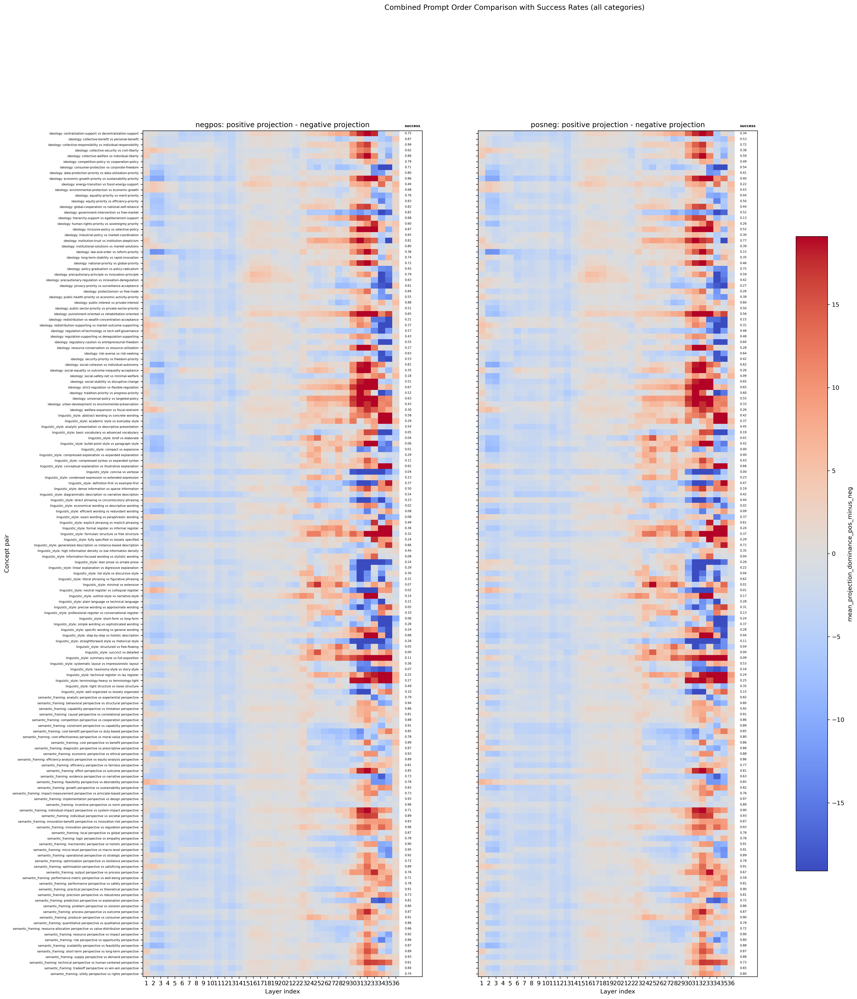

Saved comparison heatmap with success rates to: contrast_sanity_outputs/plots/combined_projection_heatmap_negpos_vs_posneg_with_success_rates_llama.png


In [4]:
CSV_OUTPUT_DIR = Path('contrast_sanity_outputs')
PLOT_OUTPUT_DIR = CSV_OUTPUT_DIR / 'plots'
PLOT_OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

combined_projection_all_csv = CSV_OUTPUT_DIR / 'combined_concept_projection_all.csv'
combined_projection_all_df = pd.read_csv(combined_projection_all_csv)

JUDGEMENT_DIR = Path('outputs/vllm_google_gemma-3-4b-it_judgements_combined_full_Qwen2.5-3B-Instruct')
JUDGEMENT_JSONL = JUDGEMENT_DIR / 'judgements.jsonl'

ORDER_COMPARISON_VALUE_COL = 'mean_projection_dominance_pos_minus_neg'


def load_pair_order_success_rates(judgement_jsonl: Path) -> pd.DataFrame:
    rows = []
    with judgement_jsonl.open('r', encoding='utf-8') as f:
        for line in f:
            if line.strip():
                rows.append(json.loads(line))

    df = pd.DataFrame(rows)
    if df.empty:
        raise ValueError(f'No judgement rows found in {judgement_jsonl}')

    order_col = 'combined_order' if 'combined_order' in df.columns else 'variant'
    success_df = (
        df
        .groupby(['category_key', 'pair_slug', order_col], as_index=False)
        .agg(
            success_rate=('success', 'mean'),
            n=('success', 'size'),
        )
        .rename(columns={order_col: 'variant'})
    )
    return success_df


def pivot_order_variant_with_pair_slug(
    df: pd.DataFrame,
    variant: str,
    value_col: str = ORDER_COMPARISON_VALUE_COL,
) -> pd.DataFrame:
    subset = df.loc[df['variant'] == variant].copy()
    subset = subset.sort_values(['category_key', 'pair_slug', 'concept_label', 'layer_index'])
    pivot = subset.pivot_table(
        index=['category_key', 'pair_slug', 'concept_label'],
        columns='layer_index',
        values=value_col,
        aggfunc='mean',
    )
    return pivot.reindex(sorted(pivot.columns), axis=1)


def success_lookup(success_df: pd.DataFrame, variant: str) -> dict[tuple[str, str], float]:
    subset = success_df.loc[success_df['variant'] == variant]
    return {
        (row.category_key, row.pair_slug): row.success_rate
        for row in subset.itertuples(index=False)
    }


def plot_negpos_vs_posneg_with_success_rates(
    projection_df: pd.DataFrame,
    success_df: pd.DataFrame,
    value_col: str = ORDER_COMPARISON_VALUE_COL,
    output_dir: Path = PLOT_OUTPUT_DIR,
):
    negpos = pivot_order_variant_with_pair_slug(projection_df, 'negpos', value_col=value_col)
    posneg = pivot_order_variant_with_pair_slug(projection_df, 'posneg', value_col=value_col)

    common_index = negpos.index.intersection(posneg.index)
    common_cols = negpos.columns.intersection(posneg.columns)
    negpos = negpos.loc[common_index, common_cols]
    posneg = posneg.loc[common_index, common_cols]

    labels = [f'{category}: {concept}' for category, _, concept in common_index]
    success_maps = {
        'negpos': success_lookup(success_df, 'negpos'),
        'posneg': success_lookup(success_df, 'posneg'),
    }

    values = np.concatenate([negpos.to_numpy().ravel(), posneg.to_numpy().ravel()])
    vmax = np.nanpercentile(np.abs(values), 98)
    if not np.isfinite(vmax) or vmax == 0:
        vmax = np.nanmax(np.abs(values))
    if not np.isfinite(vmax) or vmax == 0:
        vmax = 1.0

    height = max(8, 0.17 * len(labels))
    fig, axes = plt.subplots(1, 2, figsize=(23, height), dpi=300, sharey=True)

    for ax, variant, table in zip(axes, ['negpos', 'posneg'], [negpos, posneg]):
        im = ax.imshow(table.to_numpy(), aspect='auto', cmap='coolwarm', vmin=-vmax, vmax=vmax)
        ax.set_xticks(range(len(table.columns)))
        ax.set_xticklabels(table.columns)
        ax.set_xlabel('Layer index')
        ax.set_title(f'{variant}: positive projection - negative projection')

        x_text = len(table.columns) + 0.25
        ax.set_xlim(-0.5, len(table.columns) + 2.7)
        ax.text(
            x_text,
            -1.0,
            'success',
            fontsize=6,
            fontweight='bold',
            ha='left',
            va='bottom',
            clip_on=False,
        )

        variant_success = success_maps[variant]
        for y, (category_key, pair_slug, _) in enumerate(table.index):
            rate = variant_success.get((category_key, pair_slug), np.nan)
            text = 'NA' if np.isnan(rate) else f'{rate:.2f}'
            ax.text(
                x_text,
                y,
                text,
                fontsize=5,
                ha='left',
                va='center',
                clip_on=False,
            )

    axes[0].set_yticks(range(len(labels)))
    axes[0].set_yticklabels(labels, fontsize=5)
    axes[0].set_ylabel('Concept pair')

    fig.colorbar(im, ax=axes, shrink=0.75, label=value_col)
    fig.suptitle('Combined Prompt Order Comparison with Success Rates (all categories)', y=0.995)

    output_path = output_dir / 'combined_projection_heatmap_negpos_vs_posneg_with_success_rates_llama.png'
    fig.savefig(output_path, bbox_inches='tight')
    plt.show()

    return output_path, negpos, posneg


pair_order_success_df = load_pair_order_success_rates(JUDGEMENT_JSONL)

comparison_success_path, negpos_success_table, posneg_success_table = (
    plot_negpos_vs_posneg_with_success_rates(
        combined_projection_all_df,
        pair_order_success_df,
    )
)

print(f'Saved comparison heatmap with success rates to: {comparison_success_path}')

In [6]:
print("# The Science Behind Why Humans Need Sleep\n\n## Biological Imperatives and Neural Maintenance\n\nThe biological necessity of sleep remains one of the most profound mysteries in modern neuroscience, serving as a critical period for cellular repair and metabolic homeostasis. During these nocturnal hours, the body initiates complex biochemical cascades that dismantle toxic byproducts accumulated during daily activity, much like a nightly janitorial crew sweeping debris from a bustling city street to prevent structural decay. This process involves the glymphatic system, which flushes metabolic waste such as beta-amyloid proteins from the brain parenchyma, ensuring long-term neuronal health and preventing neurodegenerative conditions. Furthermore, hormonal balances are meticulously recalibrated; growth hormone secretion peaks to facilitate tissue regeneration, while cortisol levels drop to minimize inflammatory responses. Understanding the intricate mechanisms of sleep regulation reveals how the suprachiasmatic nucleus orchestrates these physiological shifts with precision, acting as the central conductor of an orchestra that maintains systemic equilibrium. Without this dedicated downtime, cellular integrity deteriorates rapidly, leading to compromised immune function and metabolic dysregulation that can precipitate severe health crises.\n\n## Psychological Restoration and Cognitive Optimization\n\nPsychologically, the mind requires a structured period of disengagement to consolidate memories and reorganize neural networks, a process comparable to archiving vast libraries of data after a day of intense research and writing. During non-REM stages, the brain strengthens synaptic connections formed during learning, effectively pruning weak pathways while reinforcing vital ones to enhance future performance and emotional stability. This consolidation is not merely passive storage but an active restructuring that integrates new information with existing knowledge frameworks, allowing for creative problem-solving and adaptive behavior. The intricate mechanisms of sleep regulation ensure that emotional memories are processed in the amygdala and hippocampus, reducing the intensity of traumatic experiences and fostering emotional resilience. Consequently, individuals who neglect this phase often exhibit impaired decision-making, reduced attention spans, and heightened irritability, as the brain fails to clear the cognitive clutter that accumulates during prolonged periods of alertness. Sleep is like a cozy blanket fort for your brain, providing a safe, enclosed space where chaotic thoughts can be sorted, filed, and transformed into coherent narratives that guide future actions.\n\n## Evolutionary Perspectives and Survival Strategies\n\nFrom an evolutionary standpoint, sleep likely emerged as a survival strategy to conserve energy during periods of low environmental predictability or high predation risk, allowing organisms to remain hidden and metabolically efficient. While the exact origins remain debated, the universal presence of sleep across diverse species suggests a fundamental biological imperative that predates complex human cognition, serving as a universal reset button for survival. The intricate mechanisms of sleep regulation have been conserved throughout millions of years of evolution, indicating that the costs of remaining perpetually vigilant outweigh the benefits of continuous activity in most ecological niches. This evolutionary trade-off prioritizes energy conservation and predator avoidance over constant movement, ensuring that organisms can recover resources and maintain physical vigor for critical moments of action. Ultimately, the persistence of sleep across the animal kingdom underscores its role as a non-negotiable component of life, essential for maintaining the delicate balance between activity and recovery that defines successful adaptation.")

# The Science Behind Why Humans Need Sleep

## Biological Imperatives and Neural Maintenance

The biological necessity of sleep remains one of the most profound mysteries in modern neuroscience, serving as a critical period for cellular repair and metabolic homeostasis. During these nocturnal hours, the body initiates complex biochemical cascades that dismantle toxic byproducts accumulated during daily activity, much like a nightly janitorial crew sweeping debris from a bustling city street to prevent structural decay. This process involves the glymphatic system, which flushes metabolic waste such as beta-amyloid proteins from the brain parenchyma, ensuring long-term neuronal health and preventing neurodegenerative conditions. Furthermore, hormonal balances are meticulously recalibrated; growth hormone secretion peaks to facilitate tissue regeneration, while cortisol levels drop to minimize inflammatory responses. Understanding the intricate mechanisms of sleep regulation reveals how t